In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import os
import bin2cell as b2c

bioimageio_utils.py (2): pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


# Read in data

In [2]:
dir_path = "/rfs/project/rfs-iCNyzSAaucw/jc2226/heart_team_data/mapped/spaceranger301/HEA_FOET14880396"
sample_name = os.path.basename(dir_path)
print(sample_name)
binned_output_path = f"{dir_path}/outs/binned_outputs/square_002um"
spaceranger_image_path = f"{dir_path}/outs/spatial"
source_image_path = "/rfs/project/rfs-iCNyzSAaucw/kk837/VisiumHD/source_images/C194_HEA_0_FFPE_1_STAN_1EAF2_s3_2024_04_23_13_40_00.tiff" 

HEA_FOET14880396


In [3]:
adata = b2c.read_visium(binned_output_path,
                        spaceranger_image_path=spaceranger_image_path,
                        source_image_path = source_image_path
                       )
adata.var_names_make_unique()
adata

anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 5032713 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

# Pre-processing

In [4]:
sc.pp.filter_cells(adata, min_counts=1)
adata

AnnData object with n_obs × n_vars = 5001851 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
# mpp: microns per pixel
mpp = 0.3
b2c.scaled_he_image(adata, mpp=mpp, save_path=f"stardist/he.tiff")

Cropped spatial coordinates key: spatial_cropped_150_buffer
Image key: 0.3_mpp_150_buffer


# HE label

### Load the HE nucleus segmentation results into the object

- from the notebook no1

In [6]:
prob_thresh_dict = {
    '0p01':0.01,
     '0p03':0.03,
    '0p05':0.05,
    '0p1':0.1,
    'default':None
}

# load the resulting segmentations into the object
for key,prob_thresh in prob_thresh_dict.items():
    print(f'### {key} ###')
    b2c.insert_labels(adata, 
                  labels_npz_path=f"stardist/he_{key}.npz", 
                  basis="spatial", 
                  spatial_key="spatial_cropped_150_buffer",
                  mpp=mpp, 
                  labels_key=f"labels_he_{key}"
                 )

### 0p01 ###
### 0p03 ###
### 0p05 ###
### 0p1 ###
### default ###


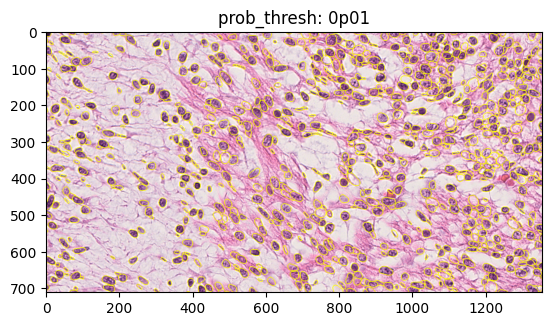

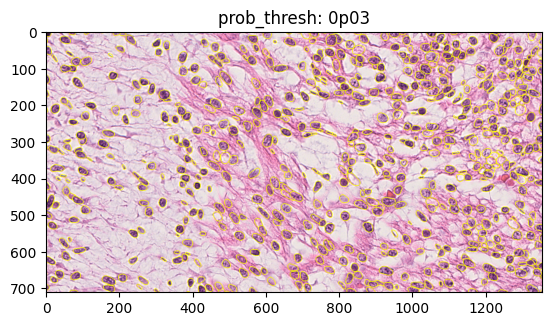

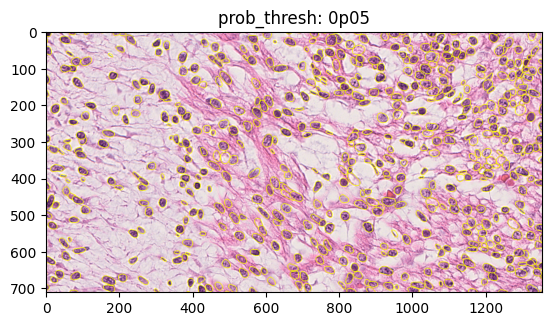

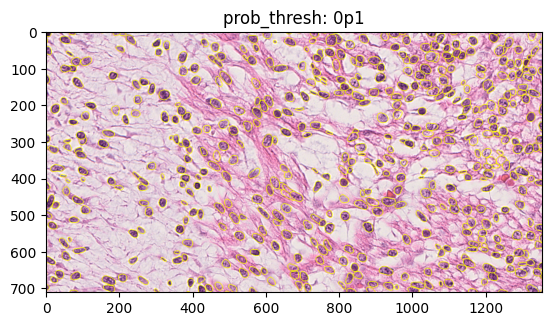

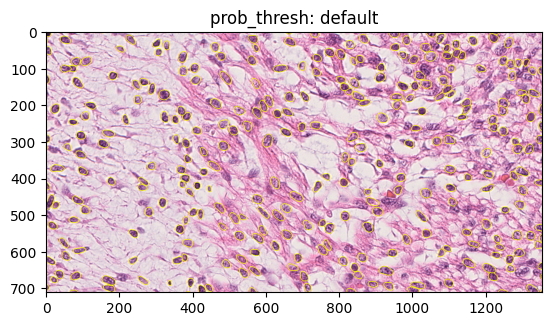

In [7]:
mask = ((adata.obs['array_row'] >= 1450) & 
        (adata.obs['array_row'] <= 1550) & 
        (adata.obs['array_col'] >= 1400) & 
        (adata.obs['array_col'] <= 1600)
       )
bdata = adata[mask]

#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

for key in prob_thresh_dict.keys():
    rendered = b2c.view_labels(image_path="stardist/he.tiff", 
                               labels_npz_path=f"stardist/he_{key}.npz", 
                               crop=crop
                              )
    plt.imshow(rendered)
    plt.title(f'prob_thresh: {key}')
    plt.show()

### Select prob_thresh

In [8]:
prob_thresh_sel = '0p05'
adata.obs['labels_he_sel'] = adata.obs[f'labels_he_{prob_thresh_sel}']

### Expand labels

In [9]:
b2c.expand_labels(adata, 
                  labels_key='labels_he_sel',  # selected label
                  expanded_labels_key="labels_he_expanded"
                 )

3646092557.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.
3646092557.py (7): Use `squidpy.pl.spatial_scatter` instead.


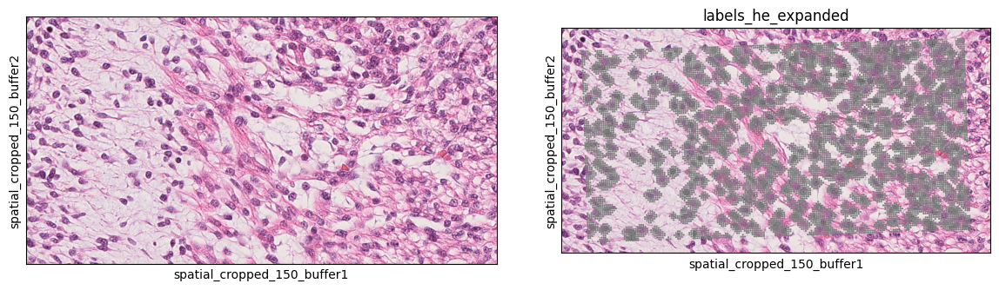

In [10]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he_expanded']>0]
bdata.obs['labels_he_expanded'] = bdata.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he_expanded"], 
              img_key=f"{mpp}_mpp_150_buffer", 
              basis="spatial_cropped_150_buffer",
              legend_loc=None
             )

# GEX label

### Load the GEX segmentation results into the object

- from notebook no2

In [11]:
b2c.grid_image(adata, "n_counts", mpp=mpp, sigma=5, save_path="stardist/gex.tiff")

In [12]:
prob_thresh_dict = {
    '0p01':0.01,
     '0p03':0.03,
    '0p05':0.05,
    '0p1':0.1,
    'default':None
}

for key,prob_thresh in prob_thresh_dict.items():
    print(f'### {key} ###')
    b2c.insert_labels(adata, 
                  labels_npz_path=f"stardist/gex_{key}.npz", 
                  basis="array", 
                  mpp=mpp, 
                  labels_key=f"labels_gex_{key}"
                 )

### 0p01 ###
### 0p03 ###
### 0p05 ###
### 0p1 ###
### default ###


284114213.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


1632


284114213.py (14): Use `squidpy.pl.spatial_scatter` instead.


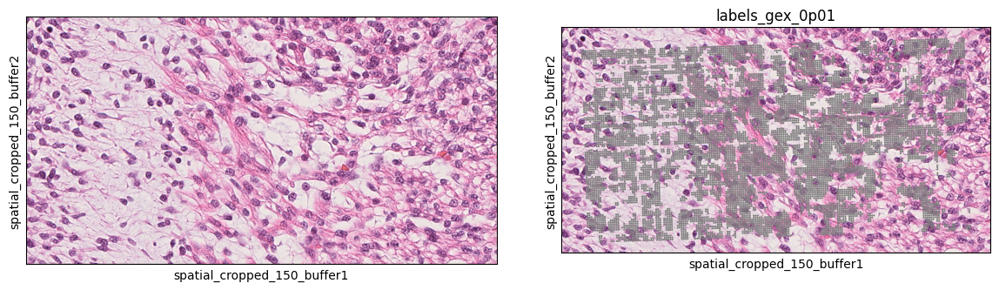

284114213.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


984


284114213.py (14): Use `squidpy.pl.spatial_scatter` instead.


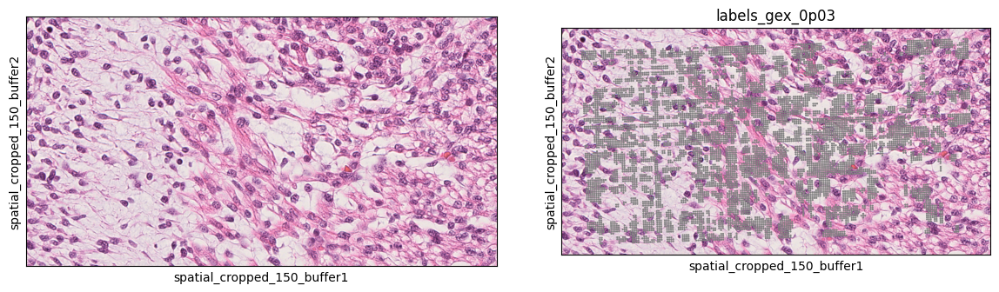

284114213.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


780


284114213.py (14): Use `squidpy.pl.spatial_scatter` instead.


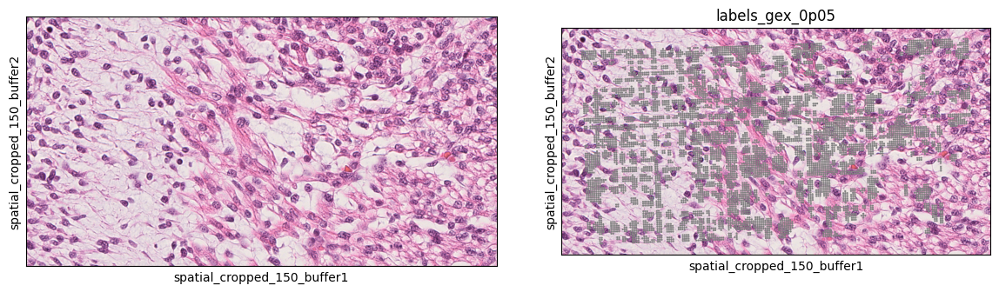

284114213.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


621


284114213.py (14): Use `squidpy.pl.spatial_scatter` instead.


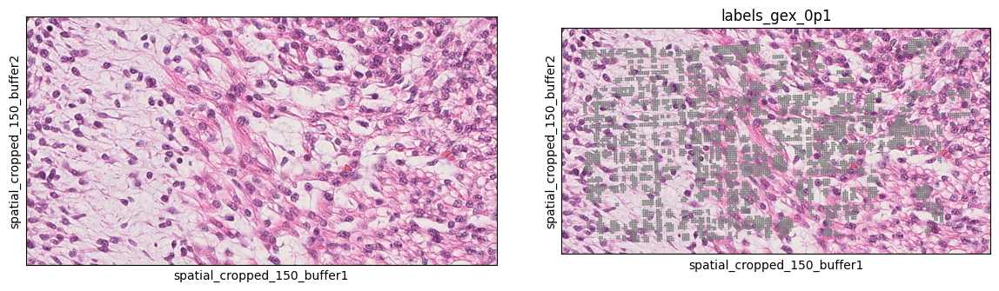

284114213.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


310


284114213.py (14): Use `squidpy.pl.spatial_scatter` instead.


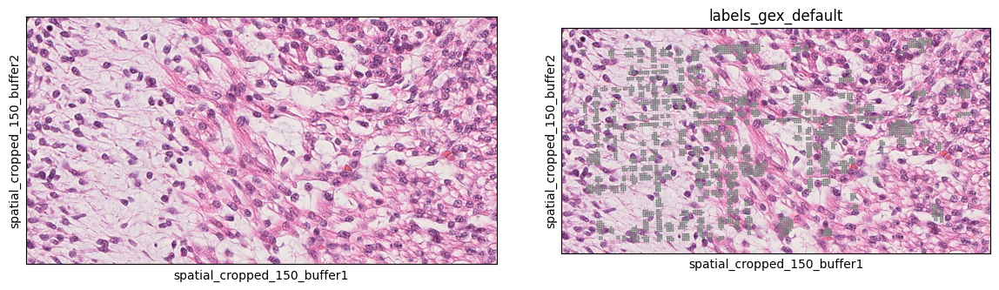

In [13]:
# zooming in
mask = ((adata.obs['array_row'] >= 1450) & 
        (adata.obs['array_row'] <= 1550) & 
        (adata.obs['array_col'] >= 1400) & 
        (adata.obs['array_col'] <= 1600)
       )
bdata = adata[mask]

for key in prob_thresh_dict.keys():
    #0 means unassigned
    bdata = bdata[bdata.obs[f"labels_gex_{key}"]>0]
    bdata.obs[f"labels_gex_{key}"] = bdata.obs[f"labels_gex_{key}"].astype(str)
    print(len(set(bdata.obs[f"labels_gex_{key}"])))
    sc.pl.spatial(bdata, color=[None, f"labels_gex_{key}"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  legend_loc=None,ncols=2
                 )

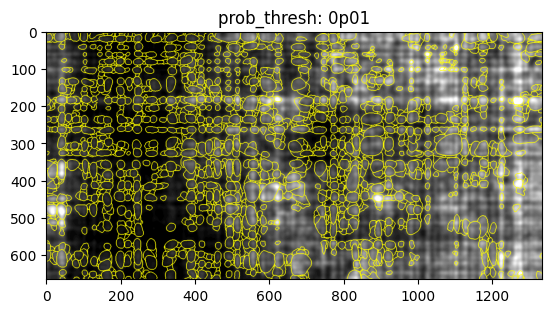

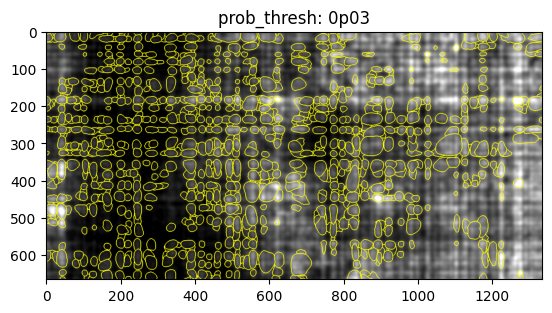

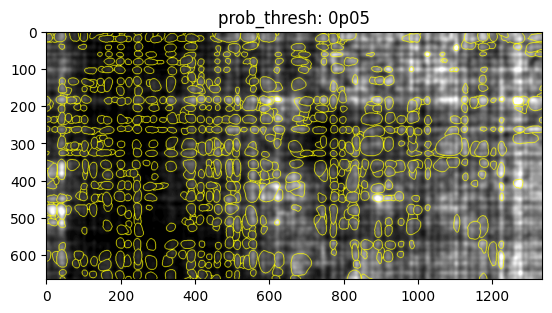

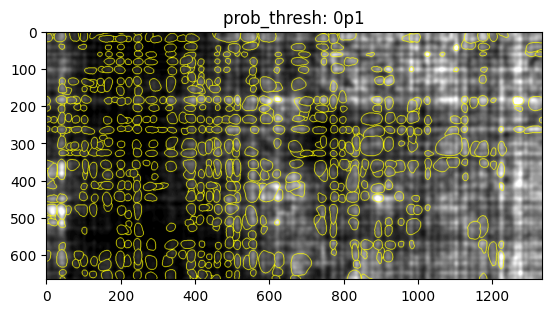

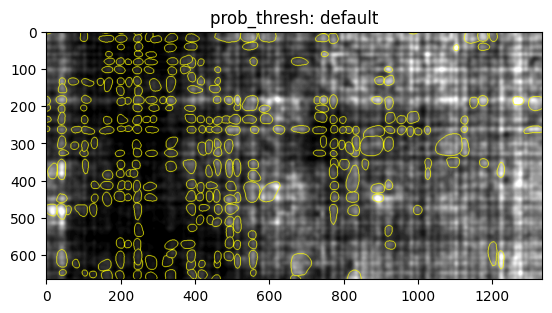

In [14]:
#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)

for key in prob_thresh_dict.keys():
    #GEX pops better with percentile normalisation performed
    rendered = b2c.view_labels(image_path="stardist/gex.tiff", 
                               labels_npz_path=f"stardist/gex_{key}.npz", 
                               crop=crop,
                               stardist_normalize=True
                              )
    plt.imshow(rendered)
    plt.title(f'prob_thresh: {key}')
    plt.show()

### Select prob_thresh

In [15]:
gex_prob_thresh_sel = '0p05' # sigma: 5
adata.obs['labels_gex_sel'] = adata.obs[f'labels_gex_{gex_prob_thresh_sel}']

# Joint HE and GEX labels

In [16]:
b2c.salvage_secondary_labels(adata, 
                             primary_label="labels_he_expanded", 
                             secondary_label="labels_gex_sel", 
                             labels_key="labels_joint"
                            )

Salvaged 38988 secondary labels


2034932217.py (10): Trying to modify attribute `.obs` of view, initializing view as actual.
2034932217.py (12): Use `squidpy.pl.spatial_scatter` instead.


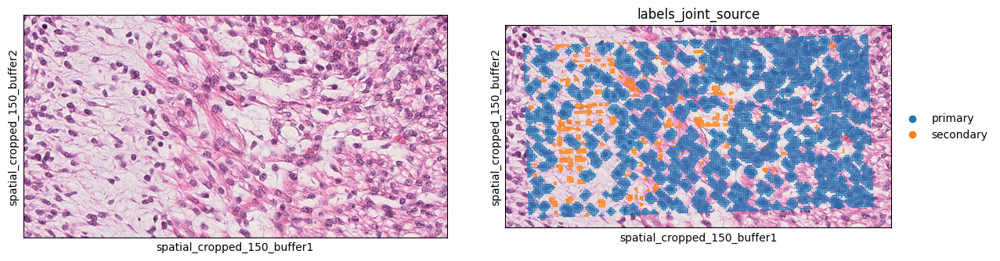

In [17]:
mask = ((adata.obs['array_row'] >= 1450) & 
        (adata.obs['array_row'] <= 1550) & 
        (adata.obs['array_col'] >= 1400) & 
        (adata.obs['array_col'] <= 1600)
       )
bdata = adata[mask]

#0 means unassigned
bdata = bdata[bdata.obs['labels_joint']>0]
bdata.obs['labels_joint'] = bdata.obs['labels_joint'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_joint_source"],
              img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

# Checking bin number

In [18]:
import seaborn as sns

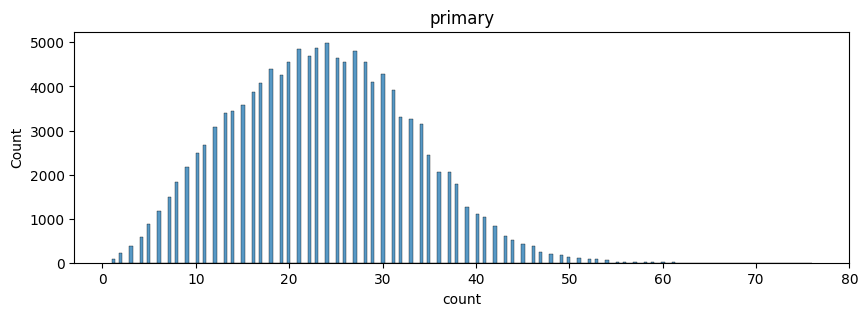

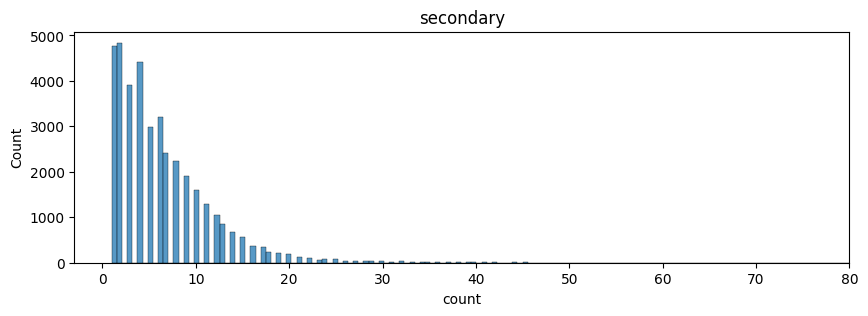

In [19]:
adata_assigned = adata[adata.obs['labels_joint']>0]
counts_1st = adata_assigned[adata_assigned.obs['labels_joint_source']=='primary'].obs['labels_joint'].value_counts()
plt.figure(figsize=(10, 3))
sns.histplot(counts_1st, kde=False, bins=200)
plt.title('primary')
plt.xlim(-3,80)
plt.show()

counts_2nd = adata_assigned[adata_assigned.obs['labels_joint_source']=='secondary'].obs['labels_joint'].value_counts()
plt.figure(figsize=(10, 3))
sns.histplot(counts_2nd, kde=False, bins=200)
plt.title('secondary')
plt.xlim(-3,80)
plt.show()

# Save the 2um-bin object

In [20]:
path_to_save = f'/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/CellTalkHHD/VisiumHD/bin2cell_objects/{sample_name}_b2c_2um-bins.h5ad'
adata.write(path_to_save)
print(path_to_save)

/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/CellTalkHHD/VisiumHD/bin2cell_objects/HEA_FOET14880396_b2c_2um-bins.h5ad


# Group the bins into cells

In [21]:
cdata = b2c.bin_to_cell(adata, labels_key="labels_joint", spatial_keys=["spatial", "spatial_cropped_150_buffer"])
cdata

AnnData object with n_obs × n_vars = 163380 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [22]:
cdata.X.data[:10]

array([1., 1., 1., 1., 1., 1., 1., 2., 1., 1.], dtype=float32)

1304684797.py (7): Use `squidpy.pl.spatial_scatter` instead.
anndata.py (1138): Trying to modify attribute `.obs` of view, initializing view as actual.


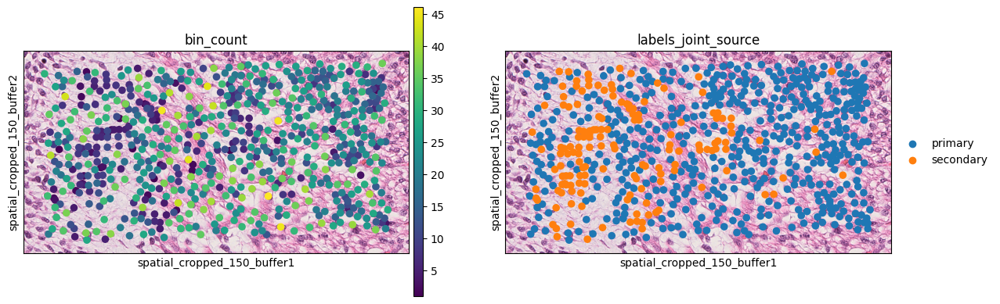

In [23]:
mask = ((cdata.obs['array_row'] >= 1450) & 
        (cdata.obs['array_row'] <= 1550) & 
        (cdata.obs['array_col'] >= 1400) & 
        (cdata.obs['array_col'] <= 1600)
       )
ddata = cdata[mask]
sc.pl.spatial(ddata, color=["bin_count", "labels_joint_source"], 
              img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer", ncols=2)

# Add manual tissue annotation

- To remove cells which are at the outside of of the tissue (in_tissue_manual)
- To separate multiple sections in a library

In [24]:
def map_loupe_to_b2c(
        adata,
        cdata,
        anno_df,
        anno,
        cell_grouping, 
        ):
     

    # Calculate the binned row and column indices in adata
    adata.obs['binned_8_row'] = adata.obs['array_row'] // 4
    adata.obs['binned_8_col'] = adata.obs['array_col'] // 4

    # Create a combined index in adata and set it as the index
    adata.obs['mapping_index_08'] = 's_008um_' + adata.obs['binned_8_row'].astype(str).str.zfill(5) + '_' + adata.obs['binned_8_col'].astype(str).str.zfill(5) + '-1'
    adata.obs['mapping_index_08'].value_counts() # most should have 16 but there are some on the tissue edge that actually have less due to partial overlap 

    # read annotations from df and map to the 2um object 
    print('annotations to map:')
    print(anno_df.head(5))
    mapping_dict = pd.Series(anno_df[anno].values,index=anno_df.index).to_dict()
    adata.obs[anno] = adata.obs['mapping_index_08'].map(mapping_dict) # update 2um object 

    # assign annotation to cells by pandas.Series.mode(). The mode is the value that appears most often which captures the most frequent annotation for that cell from 2um data
    filtered_data = adata.obs[(adata.obs[cell_grouping] != 0) & adata.obs[anno].notna()]
    cell_annotation = (
        filtered_data.groupby(cell_grouping)[anno]
        .apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
    )
    cell_annotation.index = cell_annotation.index.astype('str')
    cdata.obs[anno] = cdata.obs.index.map(cell_annotation).astype('category') # label cells 
    print('Annotations in b2c object:')
    print(cdata.obs[anno].value_counts())

In [25]:
manual_annotation_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/CellTalkHHD/VisiumHD/01_bin2cell/loupe_manual_annotation'

In [26]:
# in_tissue_manual
anno_df = pd.read_csv(f'{manual_annotation_dir}/{"_".join(sample_name.split("_")[:3])}_in_tissue_manual.csv',
                      index_col=0)
anno_df.fillna('tissue',inplace=True)

# parameter for mapping manual in_tissue annotation
anno = 'in_tissue_manual'
cell_grouping = 'labels_joint'

map_loupe_to_b2c(adata,
                 cdata,
                 anno_df,
                 anno,
                 cell_grouping)

annotations to map:
                      in_tissue_manual
Barcode                               
s_008um_00301_00321-1           tissue
s_008um_00602_00290-1           tissue
s_008um_00377_00750-1           tissue
s_008um_00383_00696-1           tissue
s_008um_00526_00291-1           tissue
Annotations in b2c object:
in_tissue_manual
tissue       161283
no_tissue      2097
Name: count, dtype: int64


In [ ]:
'''
# donor_section_ID
anno_df = pd.read_csv(f'{manual_annotation_dir}/{"_".join(sample_name.split("_")[:3])}_donor-section-ID.csv',
                      index_col=0)
anno_df.fillna('nan',inplace=True)

# parameter for mapping manual in_tissue annotation
anno = 'donor_section_ID'
cell_grouping = 'labels_joint'

map_loupe_to_b2c(adata,
                 cdata,
                 anno_df,
                 anno,
                 cell_grouping)
'''

In [28]:
cdata.obs['in_tissue_manual'].value_counts()

in_tissue_manual
tissue       161283
no_tissue      2097
Name: count, dtype: int64

# Save the grouped cell object

In [29]:
path_to_save = f'/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/CellTalkHHD/VisiumHD/bin2cell_objects/{sample_name}_b2c_cells.h5ad'
cdata.write(path_to_save)
print(path_to_save)

/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/CellTalkHHD/VisiumHD/bin2cell_objects/HEA_FOET14880396_b2c_cells.h5ad
